# **Customer Segmentation**
**Subject**: BADS 7105 - CRM Analytics and Intelligence

**Student** : Phannita Thianthammachat 

**ID** : 6310412026


# **Load Dependencies & Load Data**


In [1]:
# Mounting Google Drive locally
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
# Install Machine learning library
!pip install pycaret

     |████████████████████████████████| 288 kB 14.9 MB/s 
     |████████████████████████████████| 6.8 MB 55.9 MB/s 
     |████████████████████████████████| 1.3 MB 51.3 MB/s 
     |████████████████████████████████| 56 kB 4.0 MB/s 
     |████████████████████████████████| 15.5 MB 54.9 MB/s 
     |████████████████████████████████| 261 kB 53.0 MB/s 
     |████████████████████████████████| 1.7 MB 64.7 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 113 kB 41.6 MB/s 
     |████████████████████████████████| 86 kB 5.1 MB/s 
     |████████████████████████████████| 167 kB 56.0 MB/s 
     |████████████████████████████████| 2.0 MB 46.9 MB/s 
     |████████████████████████████████| 596 kB 63.5 MB/s 
     |████████████████████████████████| 102 kB 10.8 MB/s 
     |████████████████████████████████| 303 kB 69.0 MB/s 
     |████████████████

In [3]:
import pandas as pd
import numpy as np

from pycaret.clustering import *

In [4]:
# Load 'Supermarket Data.csv' data from google drive.
df = pd.read_csv('/content/drive/My Drive/BADS7105 CRM/Final_Work/Supermarket Data.csv')

# **Data Cleaning**

In [5]:
# Transform SHOP_DATE to datetime type
df['SHOP_DATE'] = df['SHOP_DATE'].apply(lambda x: pd.to_datetime(str(x), format='%Y%m%d'))

In [6]:
df.tail(5)

,SHOP_WEEK,SHOP_DATE,SHOP_WEEKDAY,SHOP_HOUR,QUANTITY,SPEND,PROD_CODE,PROD_CODE_10,PROD_CODE_20,PROD_CODE_30,PROD_CODE_40,CUST_CODE,CUST_PRICE_SENSITIVITY,CUST_LIFESTAGE,BASKET_ID,BASKET_SIZE,BASKET_PRICE_SENSITIVITY,BASKET_TYPE,BASKET_DOMINANT_MISSION,STORE_CODE,STORE_FORMAT,STORE_REGION
956569,200617,2006-06-22,5,12,3,3.96,PRD0904997,CL00074,DEP00021,G00007,D00002,NaN,NaN,NaN,994101100088778,M,MM,Top Up,Fresh,STORE00002,LS,W01
956570,200633,2006-10-13,6,20,3,3.96,PRD0904997,CL00074,DEP00021,G00007,D00002,NaN,NaN,NaN,994102700099738,L,LA,Top Up,Fresh,STORE00002,LS,W01
956571,200617,2006-06-22,5,18,3,3.96,PRD0904997,CL00074,DEP00021,G00007,D00002,CUST0000544241,LA,YA,994101100506174,L,LA,Top Up,Fresh,STORE00002,LS,W01
956572,200619,2006-07-06,5,19,3,3.96,PRD0904997,CL00074,DEP00021,G00007,D00002,CUST0000423155,LA,YF,994101300433650,L,LA,Full Shop,Fresh,STORE00002,LS,W01
956573,200635,2006-10-23,2,21,3,3.96,PRD0904997,CL00074,DEP00021,G00007,D00002,NaN,NaN,NaN,994102900104676,L,MM,Top Up,Fresh,STORE00002,LS,W01


In [7]:
# Add column 'HR_DAY', 'HR_NIGHT' to the features.

# Add 'HR_DAY' = 'SHOP_HOUR' is not greater than to 18
df['HR_DAY'] =  np.where(np.logical_not(df['SHOP_HOUR'] > 18), 1, 0)

# Add 'HR_DAY' = 'SHOP_HOUR' is not less than or equal to 18
df['HR_NIGHT'] =  np.where(np.logical_not(df['SHOP_HOUR'] <= 18), 1, 0)

In [8]:
# Add column 'Fresh', 'Grocery', 'Mixed', 'Nonfood', 'XX' to the features.
df_BDM = pd.get_dummies(df['BASKET_DOMINANT_MISSION'])
df = pd.concat([df, df_BDM], axis = 1)

In [9]:
df.tail(5)

,SHOP_WEEK,SHOP_DATE,SHOP_WEEKDAY,SHOP_HOUR,QUANTITY,SPEND,PROD_CODE,PROD_CODE_10,PROD_CODE_20,PROD_CODE_30,PROD_CODE_40,CUST_CODE,CUST_PRICE_SENSITIVITY,CUST_LIFESTAGE,BASKET_ID,BASKET_SIZE,BASKET_PRICE_SENSITIVITY,BASKET_TYPE,BASKET_DOMINANT_MISSION,STORE_CODE,STORE_FORMAT,STORE_REGION,HR_DAY,HR_NIGHT,Fresh,Grocery,Mixed,Nonfood,XX
956569,200617,2006-06-22,5,12,3,3.96,PRD0904997,CL00074,DEP00021,G00007,D00002,NaN,NaN,NaN,994101100088778,M,MM,Top Up,Fresh,STORE00002,LS,W01,1,0,1,0,0,0,0
956570,200633,2006-10-13,6,20,3,3.96,PRD0904997,CL00074,DEP00021,G00007,D00002,NaN,NaN,NaN,994102700099738,L,LA,Top Up,Fresh,STORE00002,LS,W01,0,1,1,0,0,0,0
956571,200617,2006-06-22,5,18,3,3.96,PRD0904997,CL00074,DEP00021,G00007,D00002,CUST0000544241,LA,YA,994101100506174,L,LA,Top Up,Fresh,STORE00002,LS,W01,1,0,1,0,0,0,0
956572,200619,2006-07-06,5,19,3,3.96,PRD0904997,CL00074,DEP00021,G00007,D00002,CUST0000423155,LA,YF,994101300433650,L,LA,Full Shop,Fresh,STORE00002,LS,W01,0,1,1,0,0,0,0
956573,200635,2006-10-23,2,21,3,3.96,PRD0904997,CL00074,DEP00021,G00007,D00002,NaN,NaN,NaN,994102900104676,L,MM,Top Up,Fresh,STORE00002,LS,W01,0,1,1,0,0,0,0


# **Prepare Customer Single View**

# Define features

About Spend and Quantity
* Total Spend = SUM(SPEND)
* Total Visits = COUNT(DISTINCT BASKET ID)
* Ticket Size = SUM(SPEND)/COUNT(DISTINCT BASKET ID)
* Total Quantity = SUM(QUANTITY)

About Date and Time
* First Date = MIN(SHOP_DATE)
* Last Date = MAX(SHOP_DATE)
* Max Date = MAX(Last Date)
* Total Days = (MAX(SHOP_DATE) - MIN(SHOP_DATE)) + 1
* Recency = MAX(Last Date) - MAX(SHOP_DATE)
* Day Shopping = SUM(HR_DAY)
* Night Shopping = SUM(HR_NIGHT)

About Basket Dominant Mission
* No. of Fresh = SUM(Fresh)
* No. of Grocery = SUM(Grosery)
* No. of Mixed = SUM(Mixed)
* No. of Nonfood = SUM(Nonfood)
* No. of XX = SUM(XX)

# Calculate features

In [10]:
# prepare customer single view
df_csv = df_groupby = df[df['CUST_CODE'].notnull()].groupby(by=['CUST_CODE']).agg(TotalSpend=('SPEND', 'sum'),
                                                                                  TotalVisits=('BASKET_ID', 'nunique'),
                                                                                  TotalQuantity=('QUANTITY', 'sum'),
                                                                                  FirstDate=('SHOP_DATE', 'min'),
                                                                                  LastDate=('SHOP_DATE', 'max'),
                                                                                  DayShopping=('HR_DAY','sum'),
                                                                                  NightShopping=('HR_NIGHT','sum'),
                                                                                  N_Fresh=('Fresh','sum'),
                                                                                  N_Grocery=('Grocery','sum'),
                                                                                  N_Mixed=('Mixed','sum'),
                                                                                  N_Nonfood=('Nonfood','sum'),
                                                                                  N_XX=('XX','sum'),
                                                                                  
                                                                                  ).reset_index()

In [11]:
#calculate Ticket Size
df_csv['TicketSize'] = df_csv['TotalSpend']/df_csv['TotalVisits']

In [12]:
#find Max Date in the dataset
MaxDate = df_csv['LastDate'].max()

In [13]:
#calculate Total Days of the relationship
df_csv['TotalDays'] = (df_csv['LastDate'] - df_csv['FirstDate']).dt.days + 1

In [14]:
#calculate Recency days
df_csv['Recency'] = (MaxDate - df_csv['LastDate']).dt.days

In [15]:
df_csv.head(10)

,CUST_CODE,TotalSpend,TotalVisits,TotalQuantity,FirstDate,LastDate,DayShopping,NightShopping,N_Fresh,N_Grocery,N_Mixed,N_Nonfood,N_XX,TicketSize,TotalDays,Recency
0,CUST0000000181,2.44,1,1,2007-01-06,2007-01-06,1,0,1.0,0.0,0.0,0,0,2.440000,1,547
1,CUST0000000369,959.33,220,923,2006-04-16,2008-07-05,651,48,479.0,87.0,127.0,6,0,4.360591,812,1
2,CUST0000000689,328.57,16,334,2007-07-22,2008-06-23,82,103,34.0,16.0,132.0,3,0,20.535625,338,13
3,CUST0000000998,5.95,3,6,2006-05-04,2006-07-07,4,0,0.0,2.0,0.0,2,0,1.983333,65,730
4,CUST0000001163,39.74,4,34,2006-10-22,2008-06-22,25,0,13.0,0.0,12.0,0,0,9.935000,610,14
5,CUST0000001194,2493.83,103,1705,2006-04-22,2008-06-20,667,531,628.0,97.0,471.0,2,0,24.211942,791,16
6,CUST0000002257,1.99,1,1,2006-07-21,2006-07-21,1,0,0.0,0.0,0.0,1,0,1.990000,1,716
7,CUST0000002499,0.34,1,1,2006-04-14,2006-04-14,1,0,1.0,0.0,0.0,0,0,0.340000,1,814
8,CUST0000002605,1.80,6,6,2006-10-08,2008-06-12,5,1,0.0,6.0,0.0,0,0,0.300000,614,24
9,CUST0000002637,124.63,15,126,2006-08-03,2008-05-30,69,16,42.0,12.0,31.0,0,0,8.308667,667,37


# **Cluster customers**

In [16]:
exp_clu = setup(data=df_csv, ignore_features=['CUST_CODE','FirstDate', 'LastDate','N_Fresh', 'N_Grocery', 'N_Mixed', 'N_Nonfood', 'N_XX'], normalize=True)

,Description,Value
0,session_id,5515
1,Original Data,"(6100, 16)"
2,Missing Values,False
3,Numeric Features,8
4,Categorical Features,0
5,Ordinal Features,False
6,High Cardinality Features,False
7,High Cardinality Method,None
8,Transformed Data,"(6100, 8)"
9,CPU Jobs,-1


In [17]:
models()

,Name,Reference
ID,,
kmeans,K-Means Clustering,sklearn.cluster._kmeans.KMeans
ap,Affinity Propagation,sklearn.cluster._affinity_propagation.Affinity...
meanshift,Mean Shift Clustering,sklearn.cluster._mean_shift.MeanShift
sc,Spectral Clustering,sklearn.cluster._spectral.SpectralClustering
hclust,Agglomerative Clustering,sklearn.cluster._agglomerative.AgglomerativeCl...
dbscan,Density-Based Spatial Clustering,sklearn.cluster._dbscan.DBSCAN
optics,OPTICS Clustering,sklearn.cluster._optics.OPTICS
birch,Birch Clustering,sklearn.cluster._birch.Birch
kmodes,K-Modes Clustering,kmodes.kmodes.KModes


In [18]:
get_metrics()

,Name,Display Name,Score Function,Scorer,Target,Args,Greater is Better,Needs Ground Truth,Custom
ID,,,,,,,,,
silhouette,Silhouette,Silhouette,<function silhouette_score at 0x7fc92e11b3b0>,make_scorer(silhouette_score),pred,{},True,False,False
chs,Calinski-Harabasz,Calinski-Harabasz,<function calinski_harabasz_score at 0x7fc92e1...,make_scorer(calinski_harabasz_score),pred,{},True,False,False
db,Davies-Bouldin,Davies-Bouldin,<function davies_bouldin_score at 0x7fc92e11b710>,make_scorer(davies_bouldin_score),pred,{},True,False,False
hs,Homogeneity Score,Homogeneity,<function homogeneity_score at 0x7fc92e0fe440>,make_scorer(homogeneity_score),pred,{},True,True,False
ari,Rand Index,Rand Index,<function adjusted_rand_score at 0x7fc92e0fe200>,make_scorer(adjusted_rand_score),pred,{},True,True,False
cs,Completeness Score,Completeness,<function completeness_score at 0x7fc92e0fe4d0>,make_scorer(completeness_score),pred,{},True,True,False


# Compare model performance

In [19]:
metrics = []
for model in models().index:
    if model in ['meanshift', 'optics']:
        continue
    create_model(model)
    metric_result = pull()
    metric_result['model'] = model
    metrics.append(metric_result)

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2011,95.4289,5.7919,0,0,0


In [20]:
cluster_metrics = pd.concat(metrics)
cluster_metrics.set_index("model", inplace=True)
cluster_metrics.sort_values(by='Silhouette', ascending=False, inplace=True)
cluster_metrics.style.highlight_max(subset=['Silhouette', 'Calinski-Harabasz'], color = 'green', axis = 0).highlight_min(subset=['Davies-Bouldin'], color = 'green', axis = 0)

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
model,,,,,,
sc,0.922300,198.740200,0.053600,0,0,0
birch,0.653000,1722.333600,1.064100,0,0,0
kmeans,0.412700,3438.811400,1.034900,0,0,0
hclust,0.351500,2907.469500,1.083800,0,0,0
dbscan,0.257200,470.824600,1.310300,0,0,0
ap,0.000000,0.000000,0.000000,0,0,0
kmodes,-0.201100,95.428900,5.791900,0,0,0


# Spectral Clustering Clustering

In [21]:
sc = create_model('sc')

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.9223,198.7402,0.0536,0,0,0


In [22]:
plot_model(sc)

# KMeans Clustering

In [23]:
kmeans = create_model('kmeans')

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4127,3438.8114,1.0349,0,0,0


In [24]:
print(kmeans)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=4, n_init=10, n_jobs=-1, precompute_distances='deprecated',
       random_state=5515, tol=0.0001, verbose=0)


In [25]:
plot_model(kmeans)

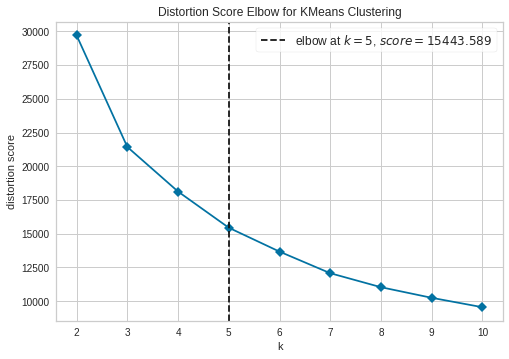

In [26]:
plot_model(kmeans, plot = 'elbow')

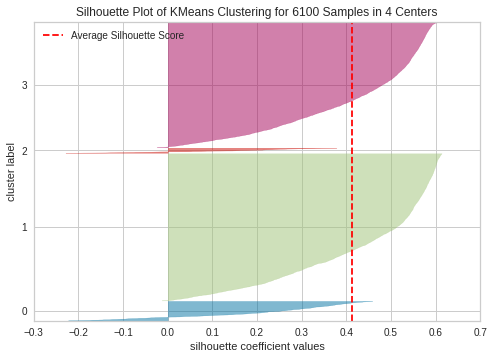

In [27]:
plot_model(kmeans, plot = 'silhouette')

## https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html

# **Interpret results and plan for actions**

In [49]:
kmeans_results = assign_model(kmeans)
kmeans_results.head(5)

,CUST_CODE,TotalSpend,TotalVisits,TotalQuantity,FirstDate,LastDate,DayShopping,NightShopping,N_Fresh,N_Grocery,N_Mixed,N_Nonfood,N_XX,TicketSize,TotalDays,Recency,Cluster
0,CUST0000000181,2.44,1,1,2007-01-06,2007-01-06,1,0,1.0,0.0,0.0,0,0,2.440000,1,547,Cluster 1
1,CUST0000000369,959.33,220,923,2006-04-16,2008-07-05,651,48,479.0,87.0,127.0,6,0,4.360591,812,1,Cluster 0
2,CUST0000000689,328.57,16,334,2007-07-22,2008-06-23,82,103,34.0,16.0,132.0,3,0,20.535625,338,13,Cluster 3
3,CUST0000000998,5.95,3,6,2006-05-04,2006-07-07,4,0,0.0,2.0,0.0,2,0,1.983333,65,730,Cluster 1
4,CUST0000001163,39.74,4,34,2006-10-22,2008-06-22,25,0,13.0,0.0,12.0,0,0,9.935000,610,14,Cluster 3


In [67]:
plot_model(kmeans, plot = 'distribution')

In [51]:
plot_model(kmeans, plot = 'distribution', feature = 'TotalSpend')

In [52]:
plot_model(kmeans, plot = 'distribution', feature = 'TotalVisits')

In [53]:
plot_model(kmeans, plot = 'distribution', feature = 'TotalQuantity')

In [54]:
plot_model(kmeans, plot = 'distribution', feature = 'DayShopping')

In [55]:
plot_model(kmeans, plot = 'distribution', feature = 'NightShopping')

In [56]:
plot_model(kmeans, plot = 'distribution', feature = 'N_Fresh')

In [57]:
plot_model(kmeans, plot = 'distribution', feature = 'N_Grocery')

In [58]:
plot_model(kmeans, plot = 'distribution', feature = 'N_Fresh')

In [59]:
plot_model(kmeans, plot = 'distribution', feature = 'N_Mixed')

In [60]:
plot_model(kmeans, plot = 'distribution', feature = 'N_Nonfood')

In [61]:
plot_model(kmeans, plot = 'distribution', feature = 'N_XX')

In [62]:
plot_model(kmeans, plot = 'distribution', feature = 'TicketSize')

In [63]:
plot_model(kmeans, plot = 'distribution', feature = 'TotalDays')

In [64]:
plot_model(kmeans, plot = 'distribution', feature = 'Recency')

In [65]:
#Count customers in each clusters
Count = pd.DataFrame(kmeans_results.groupby('Cluster').size(), columns = ['Count'])

In [66]:
# Find average of each feature in each clusters.
kmeans_results = kmeans_results.groupby('Cluster').mean().round(4)
kmeans_results = pd.concat([Count, kmeans_results], axis = 1)

import seaborn as sns
cm = sns.light_palette("#2ecc71", as_cmap=True)

kmeans_results.style.background_gradient(cmap=cm)

,Count,TotalSpend,TotalVisits,TotalQuantity,DayShopping,NightShopping,N_Fresh,N_Grocery,N_Mixed,N_Nonfood,N_XX,TicketSize,TotalDays,Recency
Cluster,,,,,,,,,,,,,,
Cluster 0,400,1577.091100,121.017500,1273.515000,713.535000,143.472500,431.967500,79.870000,334.020000,9.647500,1.502500,17.499000,778.167500,7.797500
Cluster 1,3026,14.539400,1.711200,11.168200,6.153000,1.572000,3.458700,1.093900,2.920000,0.226700,0.025800,8.252600,43.898500,438.383300
Cluster 2,106,4053.438700,259.594300,3401.971700,1707.490600,443.367900,1068.698100,177.056600,885.886800,17.094300,2.122600,19.550800,808.226400,3.773600
Cluster 3,2568,154.336600,15.995300,119.056100,65.233300,16.044800,38.139000,10.416700,30.648000,1.850500,0.223900,10.750900,581.418600,59.447000
